In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install
%pip install -q roboflow

import torch
import utils
# display = utils.notebook_init()  # checks
from IPython.display import Image, clear_output

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 15705 (delta 9), reused 15 (delta 3), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.51 MiB | 31.40 MiB/s, done.
Resolving deltas: 100% (10754/10754), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 592.7/592.7 kB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.0 MB/s eta 0:00:00


In [ ]:

from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

In [ ]:
rf = Roboflow(api_key="unauthorized")
project = rf.workspace("tanzim-mostafa").project("p2_dhaka_dataset-f6ba6")
dataset = project.version(29).download("yolov5")

In [ ]:
from google.colab import drive
drive.mount('/Dataset/P2_Dhaka')

In [ ]:
! gdown --id 1uLjJvOHPyU1gb2R5FV-6WhzXucuAMAv8

/usr/local/lib/python3.10/dist-packages/gdown/cli.py:121: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1uLjJvOHPyU1gb2R5FV-6WhzXucuAMAv8
To: /content/P2_Dhaka.zip
100% 328M/328M [00:13<00:00, 24.7MB/s]


In [ ]:
import os
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
%cd yolov5
%pwd

In [ ]:
%cd ..
%pwd

In [ ]:
# %cd datasets
# %ls
# %cd P2_Dhaka
%pwd
# %ls

'/content/yolov5'

In [ ]:
!unzip P2_Dhaka.zip


In [18]:
!python train.py --img 640 --batch 32 --epochs 100 --data P2_Dhaka/data.yaml --weights yolov5s.pt --cache
# !python train.py --img 640 --batch 16 --epochs 100 --data data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=P2_Dhaka/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_

In [19]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
%pwd

'/content/yolov5'

In [20]:
!python --version

Python 3.10.11


In [23]:
!python detect.py --weights runs/train/exp10/weights/best.pt --img 640 --conf 0.5 --source content/P2_Dhaka/test/images

detect: weights=['runs/train/exp10/weights/best.pt'], source=content/P2_Dhaka/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/303 /content/yolov5/content/P2_Dhaka/test/images/IMG_0377_2-0001_jpg.rf.2d03143fbe58609344e149173680b785.jpg: 640x640 3 buss, 2 cars, 1 motorcycle, 1 person, 11.6ms
image 2/303 /content/yolov5/content/P2_Dhaka/test/images/IMG_0377_2-0002_jpg.rf.9ae6ad88c8234a16a4434d2a11060fd4.jpg: 640x640 2 buss, 1 car, 1 motorcycle, 2 person

In [ ]:
import glob
from IPython.display import Image, display

i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i += 1

  if i < 303: # no of images
    display(Image(filename=imageName))
    print("\n")

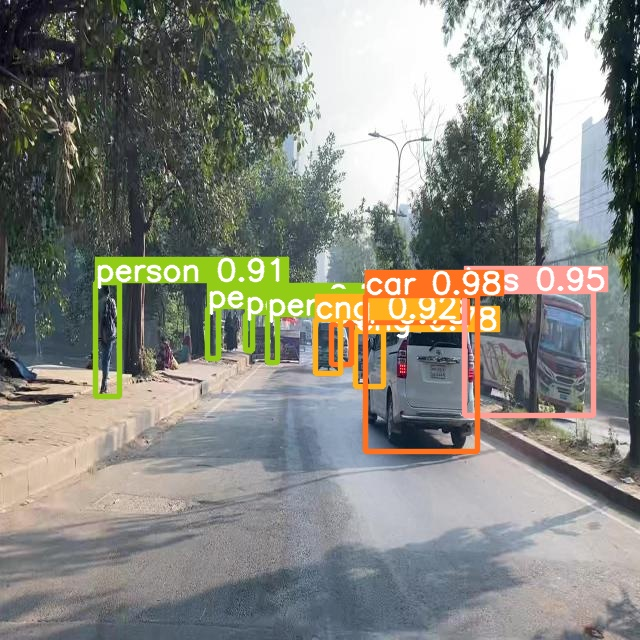

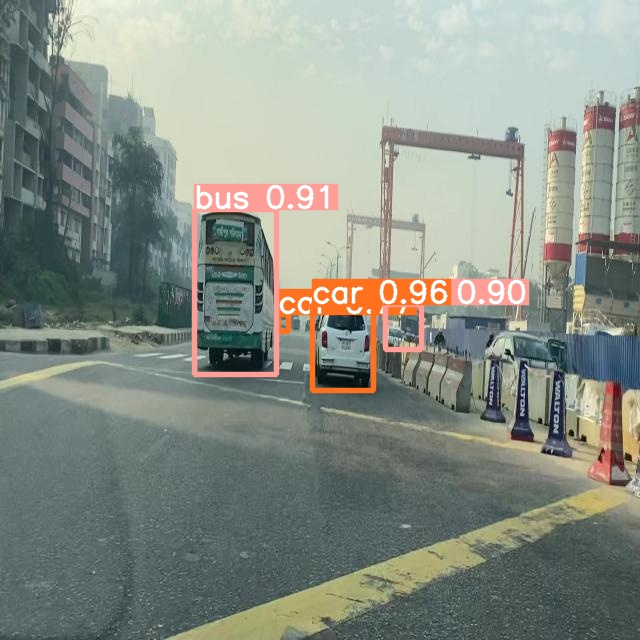

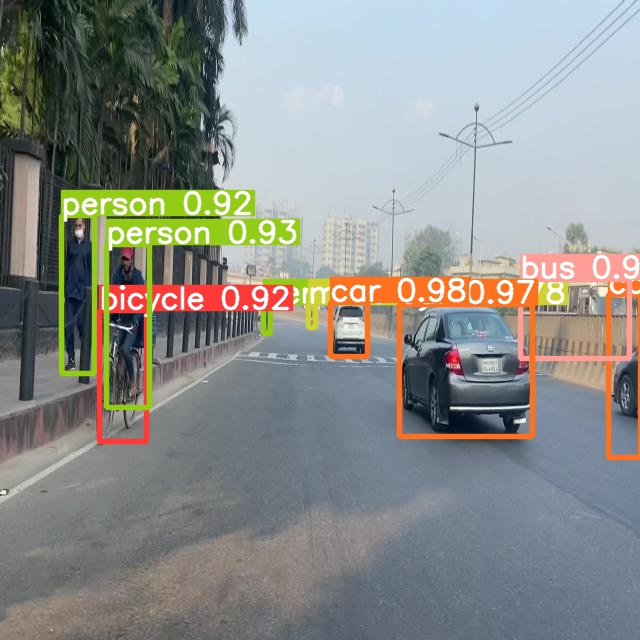

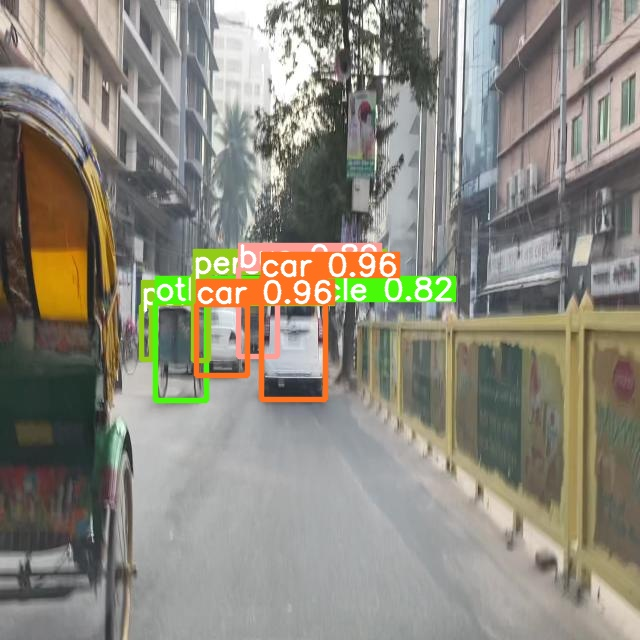

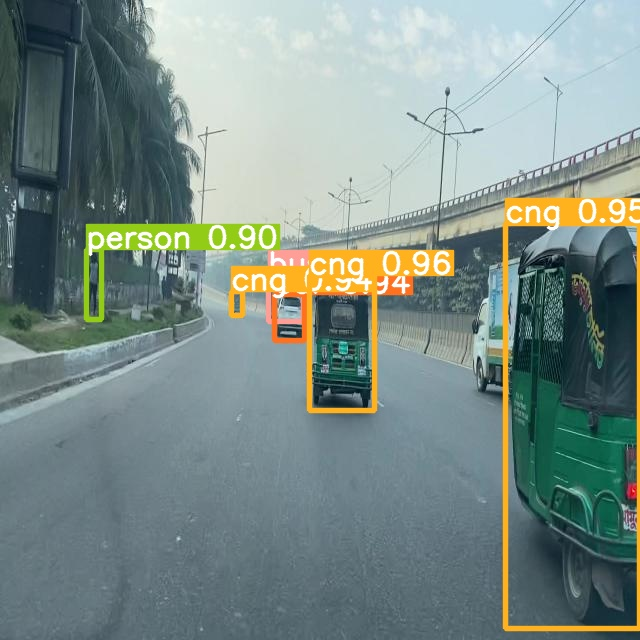

...

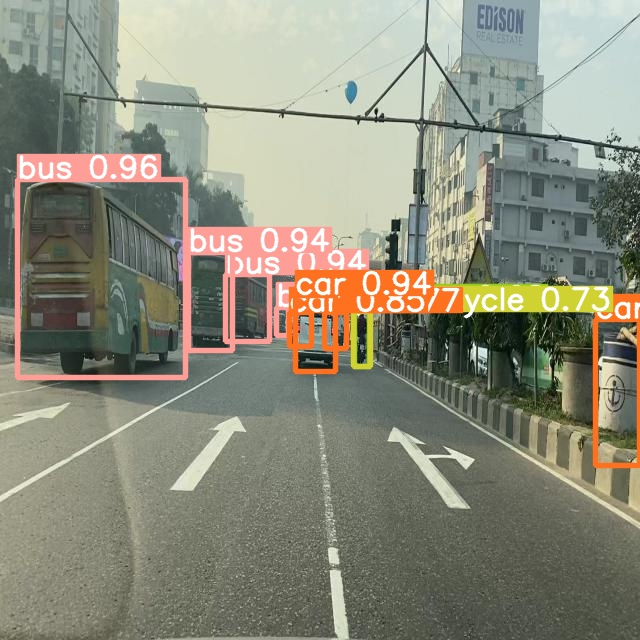

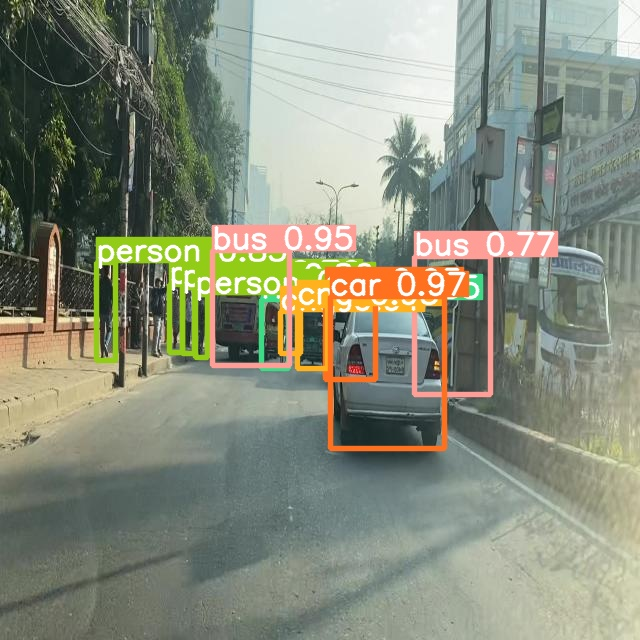

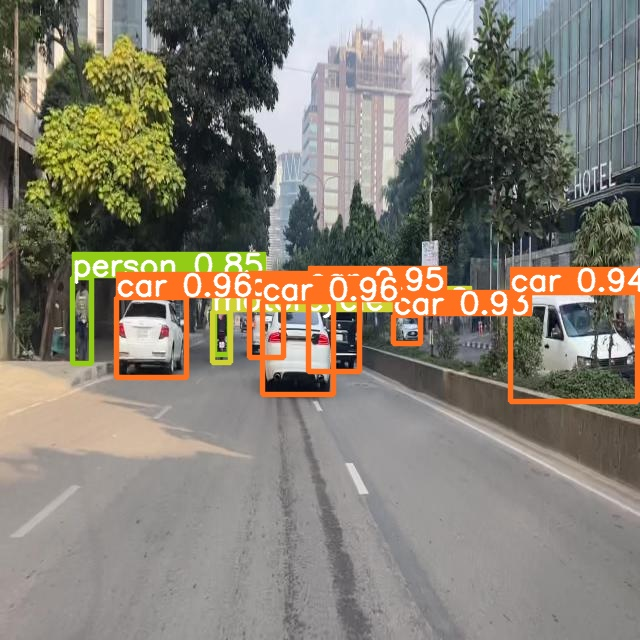

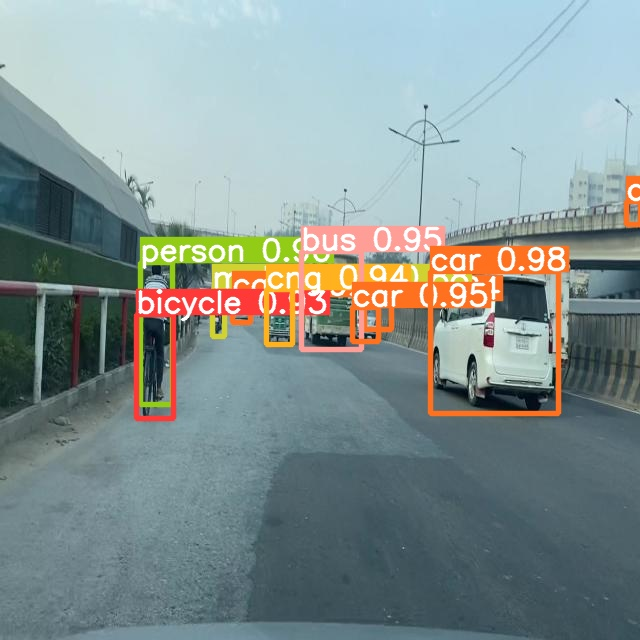

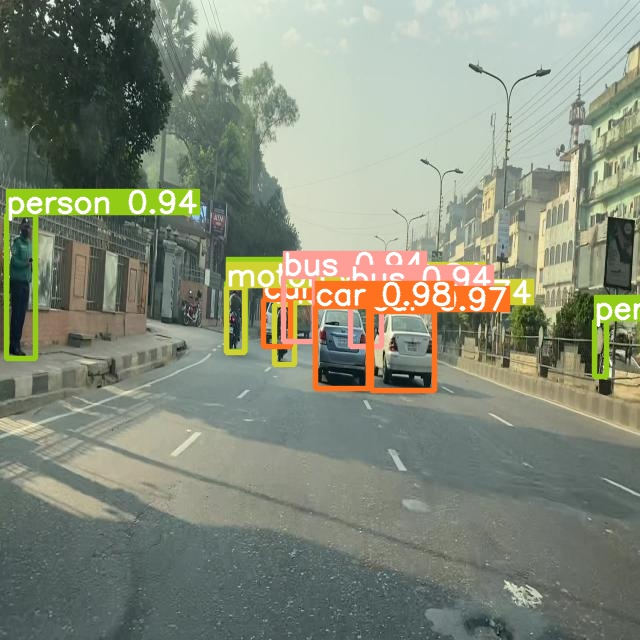

In [30]:
# import glob
# from IPython.display import Image, display

i = 0
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  i += 1

  if i < 50: # no of images
    display(Image(filename=imageName))
    print("\n")

In [22]:
from google.colab import files
files.download('./runs/train/exp10/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>